<!-- Notebook title -->
# Encoder

# 1. Notebook Description

### 1.1 Task Description
<!-- 
- A brief description of the problem you're solving with machine learning.
- Define the objective (e.g., classification, regression, clustering, etc.).
-->

TODO

---

# 2. Setup

## 2.1 Imports
<!--
- Import necessary libraries (e.g., `numpy`, `pandas`, `matplotlib`, `scikit-learn`, etc.).
-->

In [1]:
from ikt450.src.common_imports import *
from ikt450.src.config import get_paths
from ikt450.src.common_func import load_dataset, save_dataframe, ensure_dir_exists

import torch
import torchvision
import torchvision.transforms as transforms

## 2.2 Global Variables
<!--
- Define global constants, paths, and configuration settings used throughout the notebook.
-->

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=1)

### 2.2.1 Paths

In [3]:
paths = get_paths()

### 2.2.2 Seed

In [4]:
RANDOM_SEED = 7

### 2.2.3 Split ratio

In [5]:
SPLITRATIO = 0.8

## 2.3 Function Definitions
<!--
- Define helper functions that will be used multiple times in the notebook.
- Consider organizing these into separate sections (e.g., data processing functions, model evaluation functions).
-->

# 4. Data Processing

In [6]:
import datetime
import torch
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image, to_tensor
from PIL import ImageDraw, ImageFont
import torchvision.datasets as datasets

# Mean and std for normalization
mean = [0.485, 0.456, 0.406]  # ImageNet mean
std = [0.229, 0.224, 0.225]   # ImageNet std

# Custom transformation to add a date stamp
from PIL import ImageDraw, ImageFont
import datetime
import torch
from torchvision.transforms.functional import to_pil_image, to_tensor

class AddDateStampTransform:
    def __init__(self):
        self.date = datetime.datetime.now().strftime("%B %d, %Y")

    def __call__(self, image_tensor):
        # Convert Tensor to PIL Image for adding text\


        image = to_pil_image(torch.clamp(image_tensor, 0, 1))  # Clamp values to [0, 1]
        image_org = image.copy()
        draw = ImageDraw.Draw(image)
        font = ImageFont.load_default()

        # Coordinates for the text position
        x, y = 10 , 10
        x, y = torch.randint(5, image.width - 100, (1,)).item(), torch.randint(5, image.height - 20, (1,)).item()

        # Draw the outline (black)
        outline_color = (0, 0, 0)
        for offset in [(-1, -1), (-1, 1), (1, -1), (1, 1)]:  # Four corners around the text
            draw.text((x + offset[0], y + offset[1]), self.date, font=font, fill=outline_color)

        # Draw the main text (white)
        draw.text((x, y), self.date, font=font, fill=(255, 255, 255))

        image = to_tensor(image)
        image_org = to_tensor(image_org)

        diff = torch.abs(image - image_org)
        diff = torch.where(diff > 0.1, torch.tensor(1), diff)

        # where diff is 1, keep the original image, otherwise keep the stamped image
        image = torch.where(diff == 1, image, image_tensor)



        # Convert back to Tensor
        return image, image_tensor


# Define the common transformation sequence without adding the date stamp
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),        # Randomly crop the image to 224x224
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.RandomRotation(15),            # Randomly rotate the image by 15 degrees
    transforms.ColorJitter(                   # Randomly change brightness, contrast, saturation, and hue
        brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

test_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),        # Randomly crop the image to 224x224
  #  transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
  #  transforms.RandomRotation(15),            # Randomly rotate the image by 15 degrees
   # transforms.ColorJitter(                   # Randomly change brightness, contrast, saturation, and hue
    #    brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1
    #),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

# Custom dataset to apply transformations separately for the stamped and non-stamped versions
class StampedImageDataset(torch.utils.data.Dataset):
    def __init__(self, root, base_transform, stamp_transform=None):
        self.dataset = datasets.ImageFolder(root=root)
        self.base_transform = base_transform
        self.stamp_transform = stamp_transform if stamp_transform else lambda x: x

    def __getitem__(self, index):
        # Load image and apply base transformation
        img, label = self.dataset[index]
        transformed_img = self.base_transform(img)
        
        # Create stamped image by applying the stamp transformation
        stamped_img,transformed_img = self.stamp_transform(transformed_img.clone())
        
        return stamped_img, transformed_img, label

    def __len__(self):
        return len(self.dataset)

# Initialize dataset with stamping transformation
train_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/training",
    base_transform=train_transform,
    stamp_transform=AddDateStampTransform()
)

val_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/validation",
    base_transform=test_transform,
    stamp_transform=AddDateStampTransform()
)

test_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/evaluation",
    base_transform=test_transform,
    stamp_transform=AddDateStampTransform()
)
# make subselt of dataset
train_dataset = torch.utils.data.Subset(train_dataset, range(0, 1000))
# You can load it into a DataLoader as usual
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)


In [7]:

# Load and display image from dataloader


---

# 5. Model Development

In [8]:
# create an auto encoder model

import torch.nn as nn
import torch.nn.functional as F


class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, 3, padding=1)  # Increased output channels
        self.conv2 = nn.Conv2d(64, 128, 3, padding=1)  # More channels
        self.conv3 = nn.Conv2d(128, 256, 3, padding=1)  # Added layer
        self.pool = nn.MaxPool2d(2, 2)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        x = F.relu(self.conv3(x))
        x = self.pool(x)
        return x

class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.t_conv1 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.t_conv2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.t_conv3 = nn.ConvTranspose2d(64, 3, 2, stride=2)  # Final output

    def forward(self, x):
        x = F.relu(self.t_conv1(x))
        x = F.relu(self.t_conv2(x))
        x = self.t_conv3(x) # Sigmoid for pixel normalization
        return x



In [9]:

encoder_model = Encoder()
decoder_model = Decoder()
encoder_model.to(device)
decoder_model.to(device)

# Define the loss function and optimizer
criterion = nn.MSELoss()
params = list(encoder_model.parameters()) + list(decoder_model.parameters())
optimizer = torch.optim.Adam(params, lr=0.001)



In [10]:

# Train the autoencoder model
num_epochs = 10
for epoch in range(num_epochs):

    loss_epoch = 0
    val_loss_epoch = 0
    for data in train_loader:
        stamped_images, base_images, _ = data
        stamped_images = stamped_images.to(device)
        base_images = base_images.to(device)
        
        # Forward pass
        encoded = encoder_model(stamped_images)
        outputs = decoder_model(encoded)
        loss = criterion(outputs, base_images)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()

        loss_epoch += loss.item()
        optimizer.step()

    # evaluate the model

    with torch.no_grad():
        loss_epoch = 0
        for data in val_loader:
            stamped_images, base_images, _ = data
            stamped_images = stamped_images.to(device)
            base_images = base_images.to(device)
            
            # Forward pass
            encoded = encoder_model(stamped_images)
            outputs = decoder_model(encoded)
            loss = criterion(outputs, base_images)
            loss_epoch += loss.item()

        
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss_epoch:.4f} Val Loss: {loss_epoch:.4f}")

Epoch [1/10], Loss: 31.7291 Val Loss: 31.7291
Epoch [2/10], Loss: 18.4852 Val Loss: 18.4852
Epoch [3/10], Loss: 13.9471 Val Loss: 13.9471
Epoch [4/10], Loss: 11.7805 Val Loss: 11.7805
Epoch [5/10], Loss: 9.9022 Val Loss: 9.9022
Epoch [6/10], Loss: 8.8302 Val Loss: 8.8302
Epoch [7/10], Loss: 8.3738 Val Loss: 8.3738
Epoch [8/10], Loss: 7.5033 Val Loss: 7.5033
Epoch [9/10], Loss: 7.2229 Val Loss: 7.2229
Epoch [10/10], Loss: 6.8501 Val Loss: 6.8501


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08618164..1.0851388].


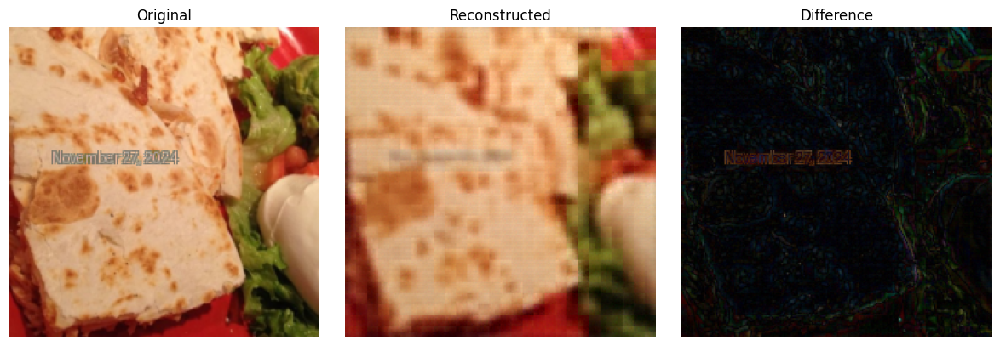

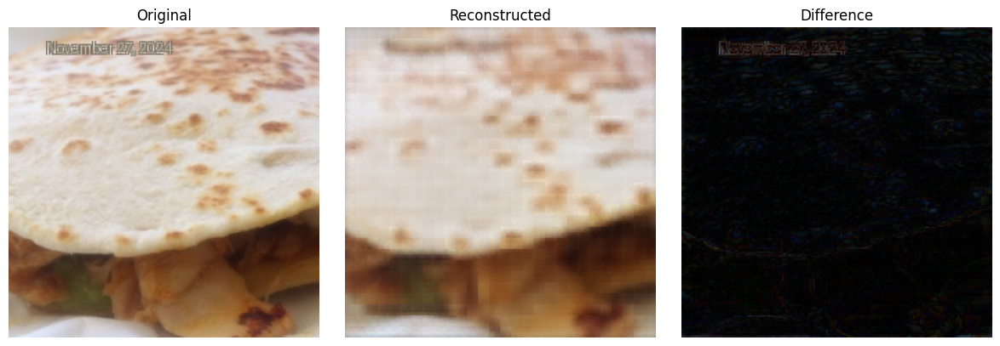

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09531489..1.0991993].


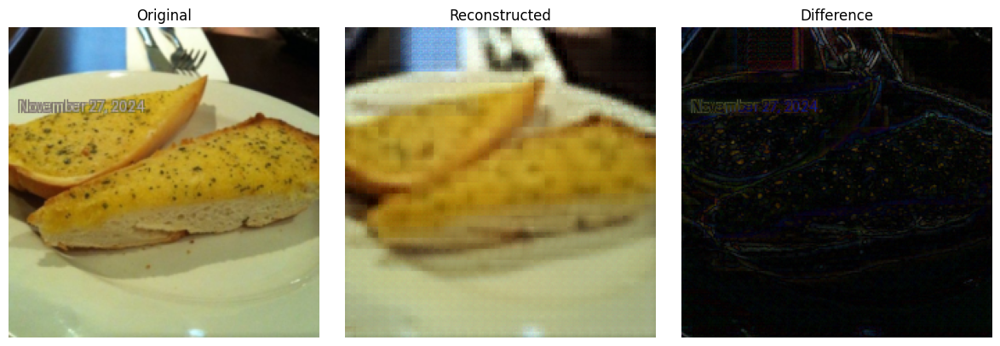

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07183632..0.9867381].


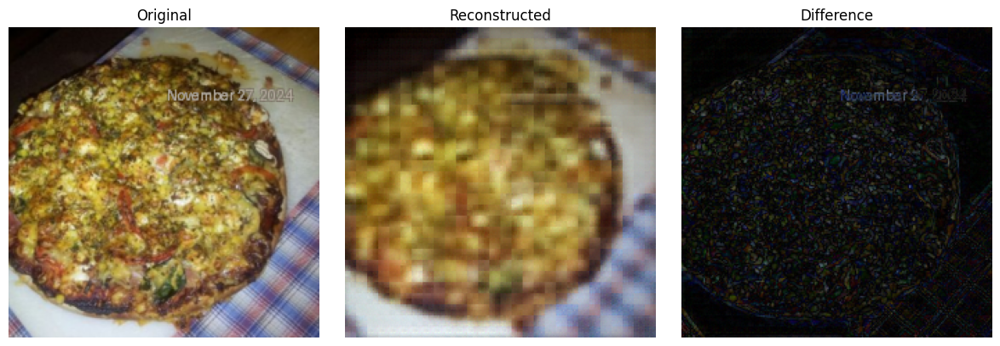

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.095586985..1.1553786].


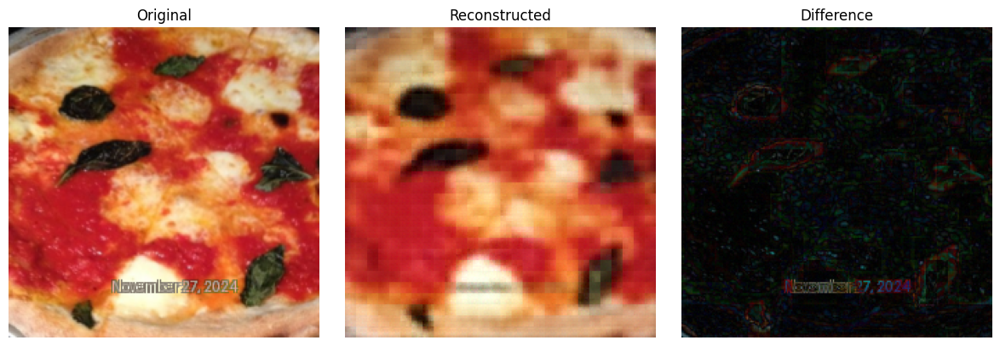

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036571294..0.9802588].


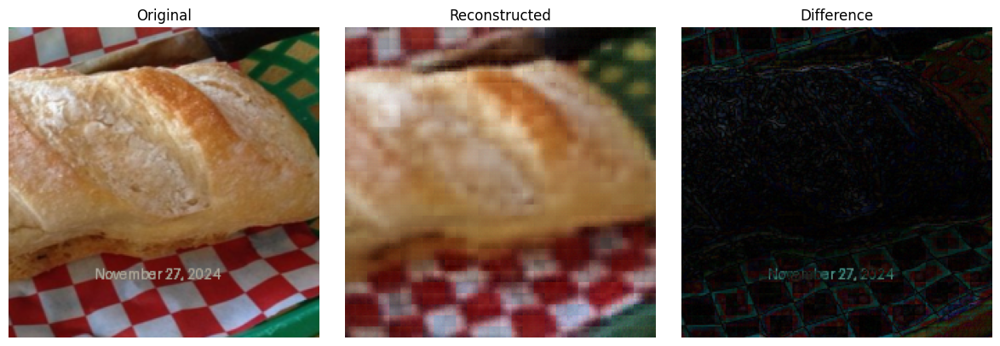

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07158497..1.0136449].


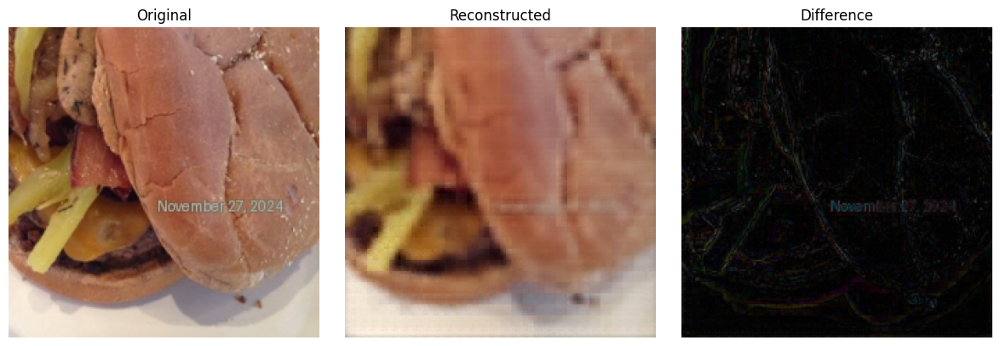

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043221682..0.99632716].


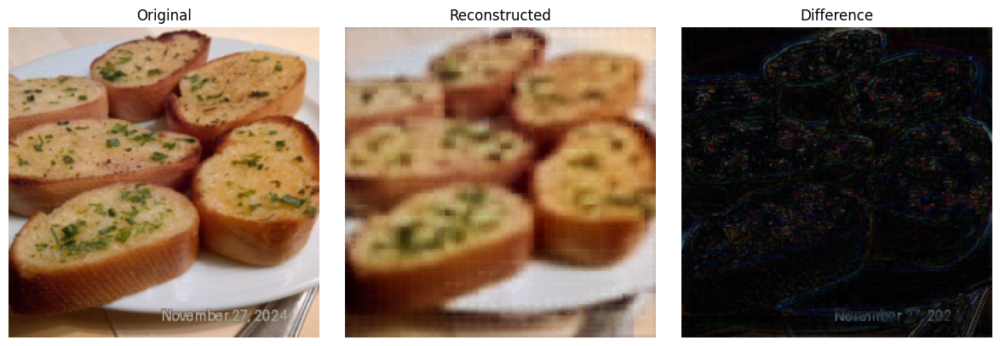

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.031177968..0.8657392].


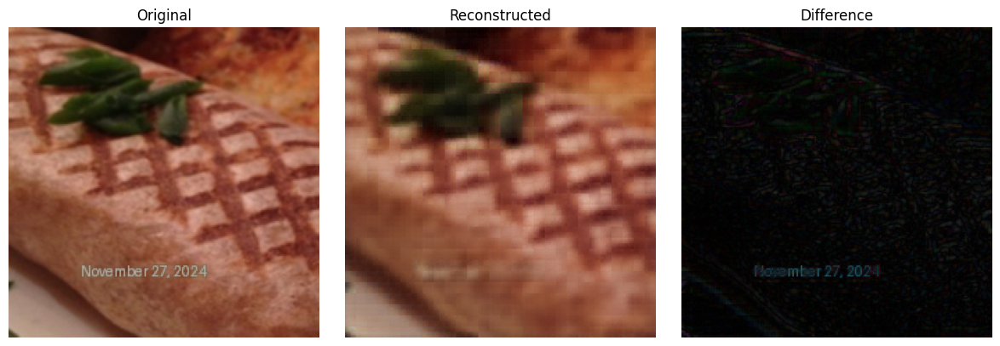

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15324923..1.107502].


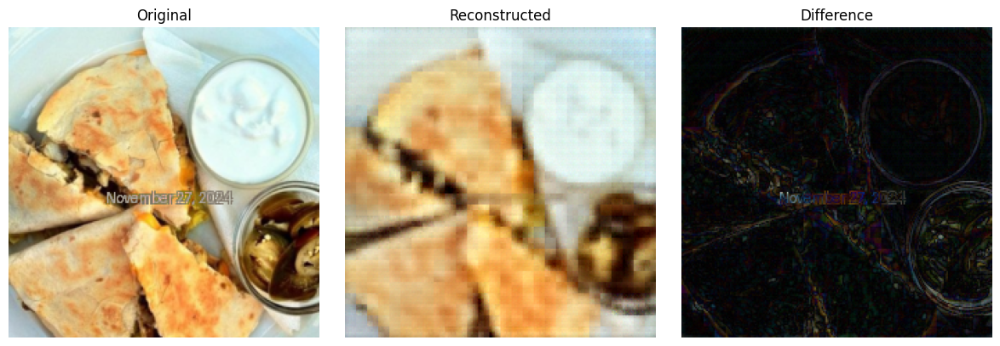

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07508892..1.0836345].


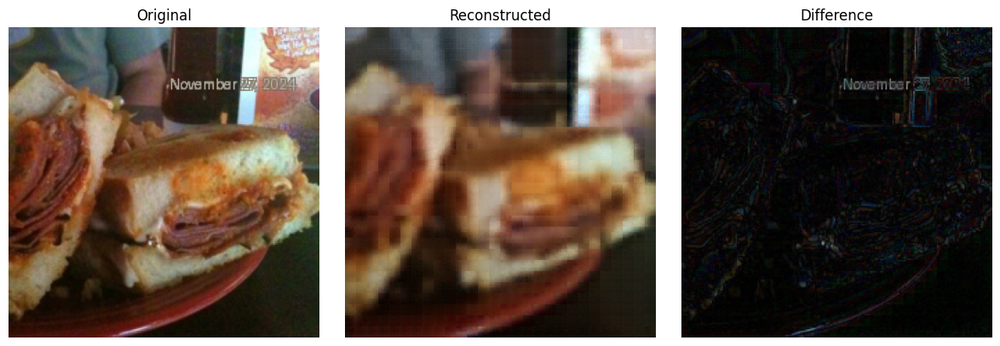

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08054373..1.0107061].


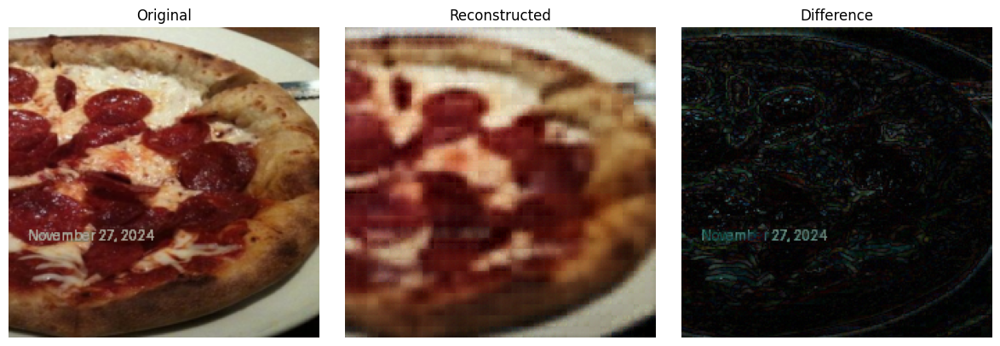

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1876466..1.0834985].


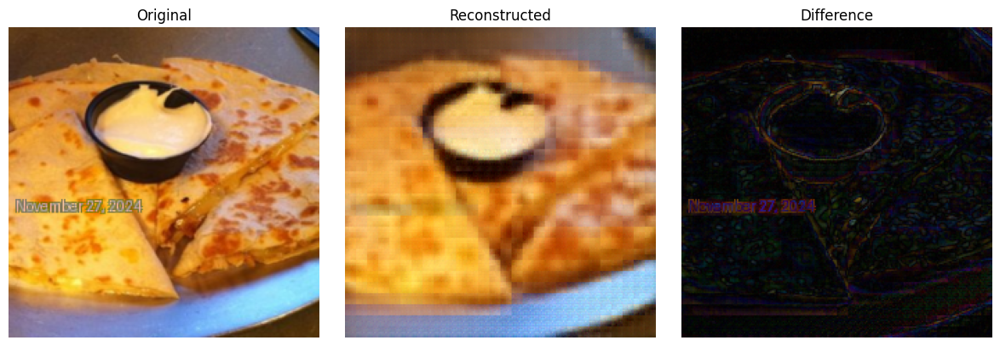

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1734871..1.2271887].


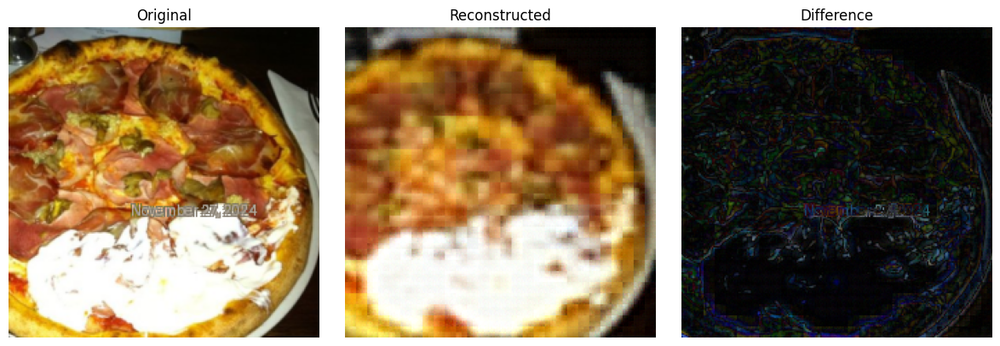

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09656063..1.0520078].


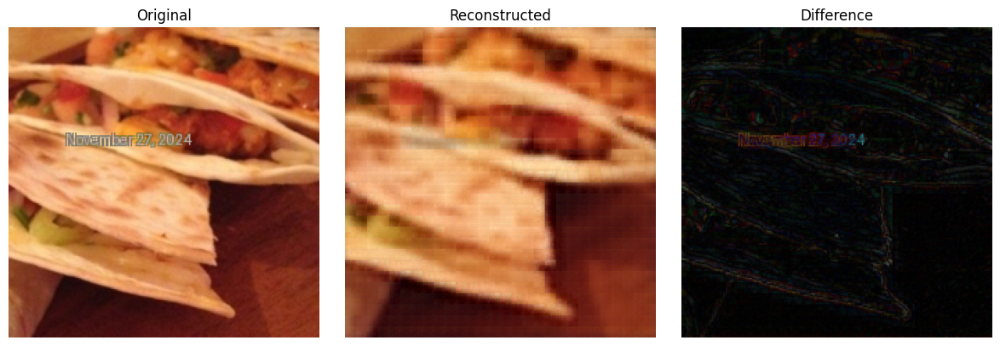

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0004928708..0.7750186].


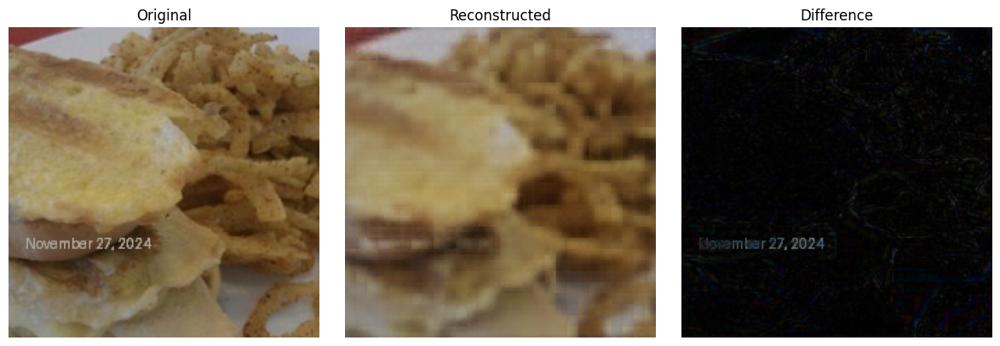

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06294477..1.0604291].


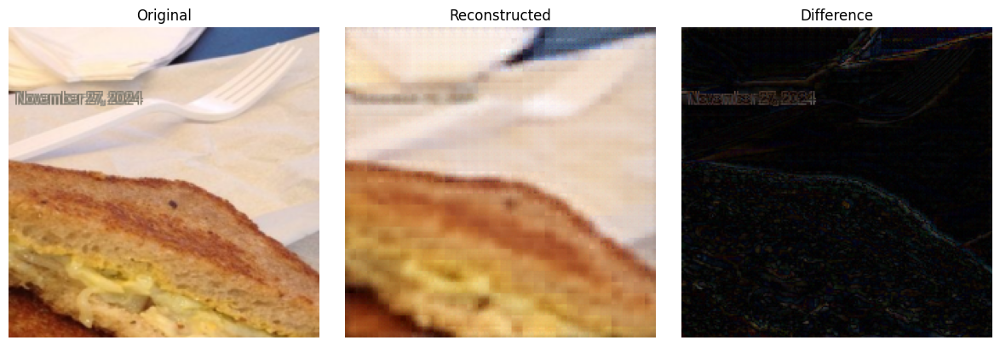

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.110064894..1.0608547].


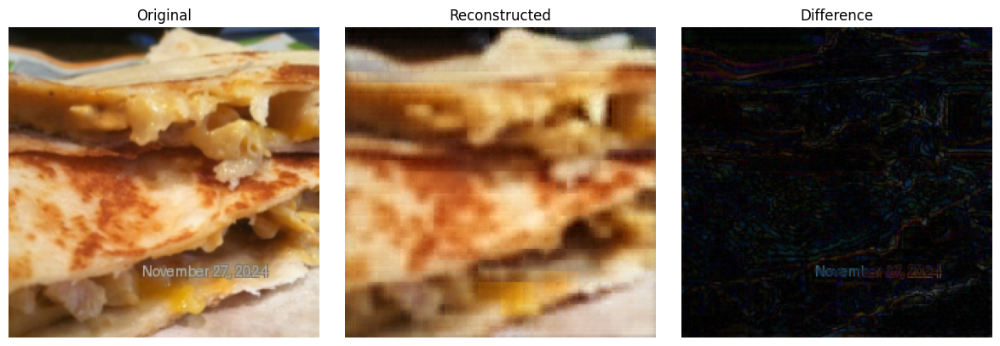

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07830179..0.9628961].


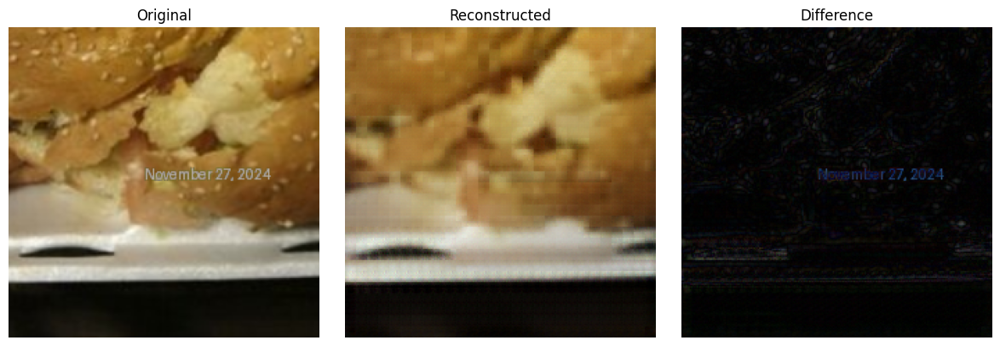

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07706091..1.1412052].


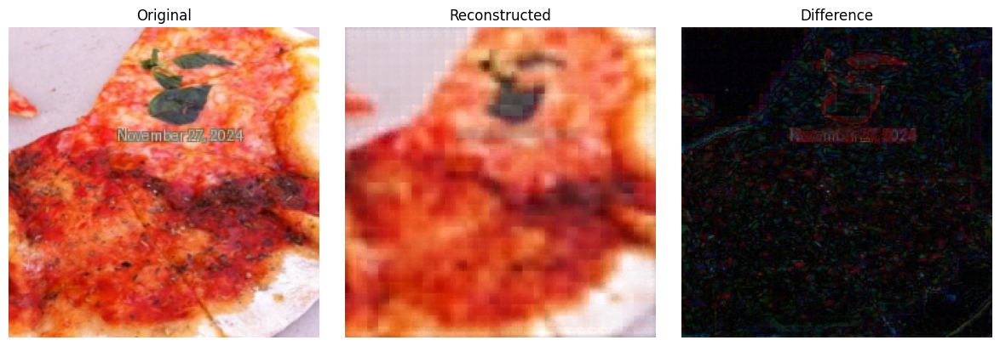

In [11]:
# display the original image and the reconstructed image
#  and display the difference between the original and the reconstructed image

def display_images(original, reconstructed):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
    for ax in axes:
        ax.axis("off")
    # denormalize images
    original = original * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)
    reconstructed = reconstructed * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)

    
    axes[0].imshow(original.permute(1, 2, 0))
    axes[0].set_title("Original")
    
    axes[1].imshow(reconstructed.permute(1, 2, 0))
    axes[1].set_title("Reconstructed")
    
    diff = torch.abs(original - reconstructed)
    axes[2].imshow(diff.permute(1, 2, 0))
    axes[2].set_title("Difference")
    
    plt.tight_layout()
    plt.show()




# Load a batch of images and display the original and reconstructed images
data_iter = iter(test_loader)
stamped_images, base_images, _ = next(data_iter)
stamped_images = stamped_images.to(device)
base_images = base_images.to(device)
with torch.no_grad():
    encoded = encoder_model(stamped_images)
    outputs = decoder_model(encoded)

for i in range(20):
    display_images(stamped_images[i].cpu(), outputs[i].cpu())



## 5.1 Model Selection
<!--
- Choose the model(s) to be trained (e.g., linear regression, decision trees, neural networks).
-->

## 5.2 Model Training
<!--
- Train the selected model(s) using the training data.
-->

## 5.3 Model Evaluation
<!--
- Evaluate model performance on validation data.
- Use appropriate metrics (e.g., accuracy, precision, recall, RMSE).
-->

## 5.4 Hyperparameter Tuning
<!--
- Fine-tune the model using techniques like Grid Search or Random Search.
- Evaluate the impact of different hyperparameters.
-->

## 5.5 Model Testing
<!--
- Evaluate the final model on the test dataset.
- Ensure that the model generalizes well to unseen data.
-->

## 5.6 Model Interpretation (Optional)
<!--
- Interpret the model results (e.g., feature importance, SHAP values).
- Discuss the strengths and limitations of the model.
-->

---

# 6. Predictions


## 6.1 Make Predictions
<!--
- Use the trained model to make predictions on new/unseen data.
-->

## 6.2 Save Model and Results
<!--
- Save the trained model to disk for future use.
- Export prediction results for further analysis.
-->

---

# 7. Documentation and Reporting

## 7.1 Summary of Findings
<!--
- Summarize the results and findings of the analysis.
-->

## 7.2 Next Steps
<!--
- Suggest further improvements, alternative models, or future work.
-->

## 7.3 References
<!--
- Cite any resources, papers, or documentation used.
-->